<a href="https://colab.research.google.com/github/S-Zorro/Tripod-Concealer/blob/main/Tripod_Concealer_Test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Run all these cells to see the results

In [ ]:
!pip install diffusers
!pip install transformers scipy ftfy accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 19.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 33.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 89.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 15.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.1/258.1 kB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 37.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 33.5 MB/s eta 0:00:00
  Attempting uninstall: huggingface-hub
    Found existing installation: huggingface-hub 0.18.0
    Uninstalling huggingface-hub-0.18.0:
      Successfully uninstalled huggingface-hub-0.18.0


In [ ]:
from diffusers import StableDiffusionInpaintPipeline
import torch
pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    revision="fp16",
    torch_dtype=torch.float16,
).to('cuda')

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

safety_checker/model.safetensors not found


Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [ ]:
import cv2
import numpy as np

def draw_circle(radius):
    # Create a black background with dimensions 500x500 pixels
    image = np.zeros((1024, 1024, 3), dtype="uint8")

    # Define the center of the image
    center_coordinates = (512, 512)

    # Define the color of the circle (white in this case)
    color = (255, 255, 255)

    # Draw the circle
    cv2.circle(image, center_coordinates, radius, color, -1)

    cv2.imwrite('image_mask.png', image)

# Call the function and pass the radius value
radius = int(input("Enter the radius of the circle: "))
draw_circle(radius)
# 125 is a good radius for it

Enter the radius of the circle: 260


The ideal radius of tripod being 125

add path to the image in init_image


In [ ]:
from PIL import Image
# to be modified for every image
init_image = Image.open('/content/TEST.jpg').resize((1024, 1024))
# not to be modified
mask_image = Image.open('/content/image_mask.png').resize((1024, 1024))

  0%|          | 0/20 [00:00<?, ?it/s]

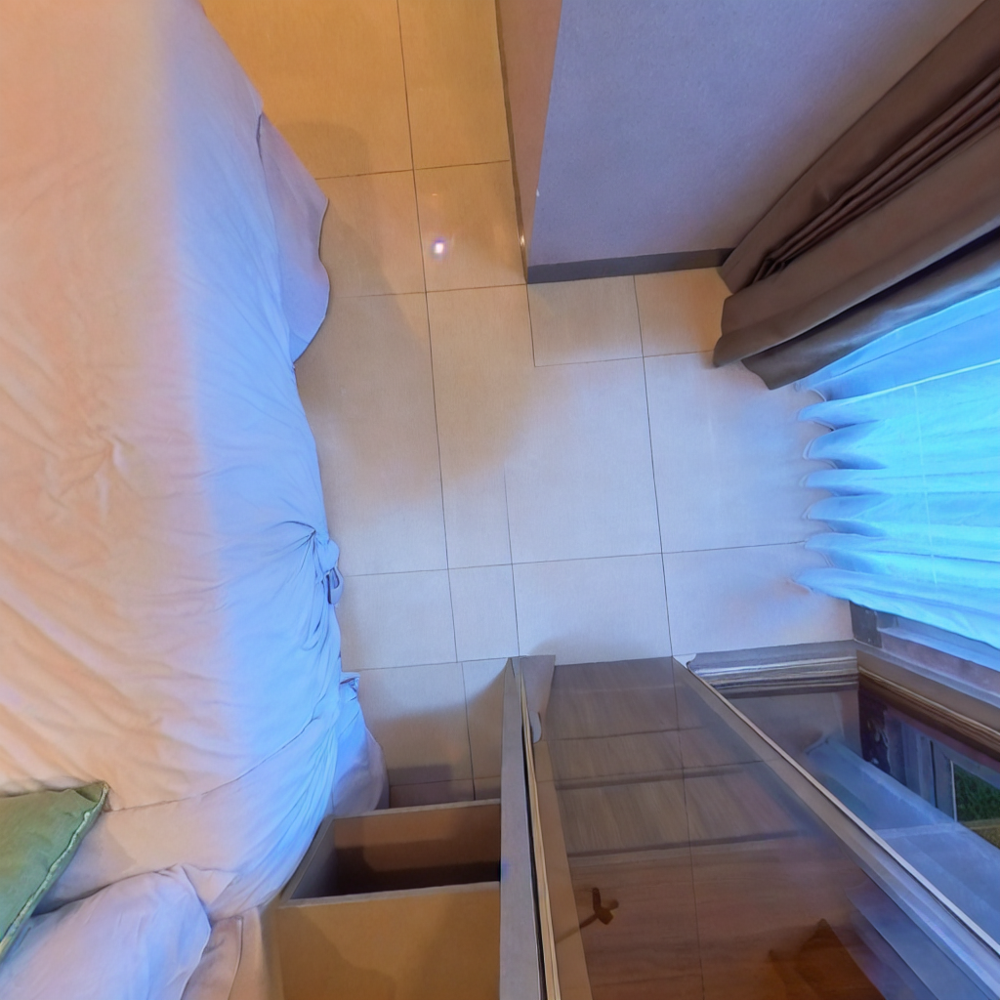

In [ ]:
prompt = "same floor, clean floor, remove objects, hide, completely hide, conceal the floor with the rectangular floor, same background,, detailed, high quality"
negative_prompt = 'mixed disrupted bulbs,switches, made up things, sheet,grass,new object, fan, objects, pieces, new, dirt, unclean floor, blur floor, mixing floor, low quality'
#image and mask_image should be PIL images.
#The mask structure is white for inpainting and black for keeping as is
image = pipe(prompt=prompt,negative_prompt=negative_prompt, image=init_image,  mask_image=mask_image, guidance_scale = 20,height = 1024, width = 1024, num_inference_steps = 20).images[0]
image

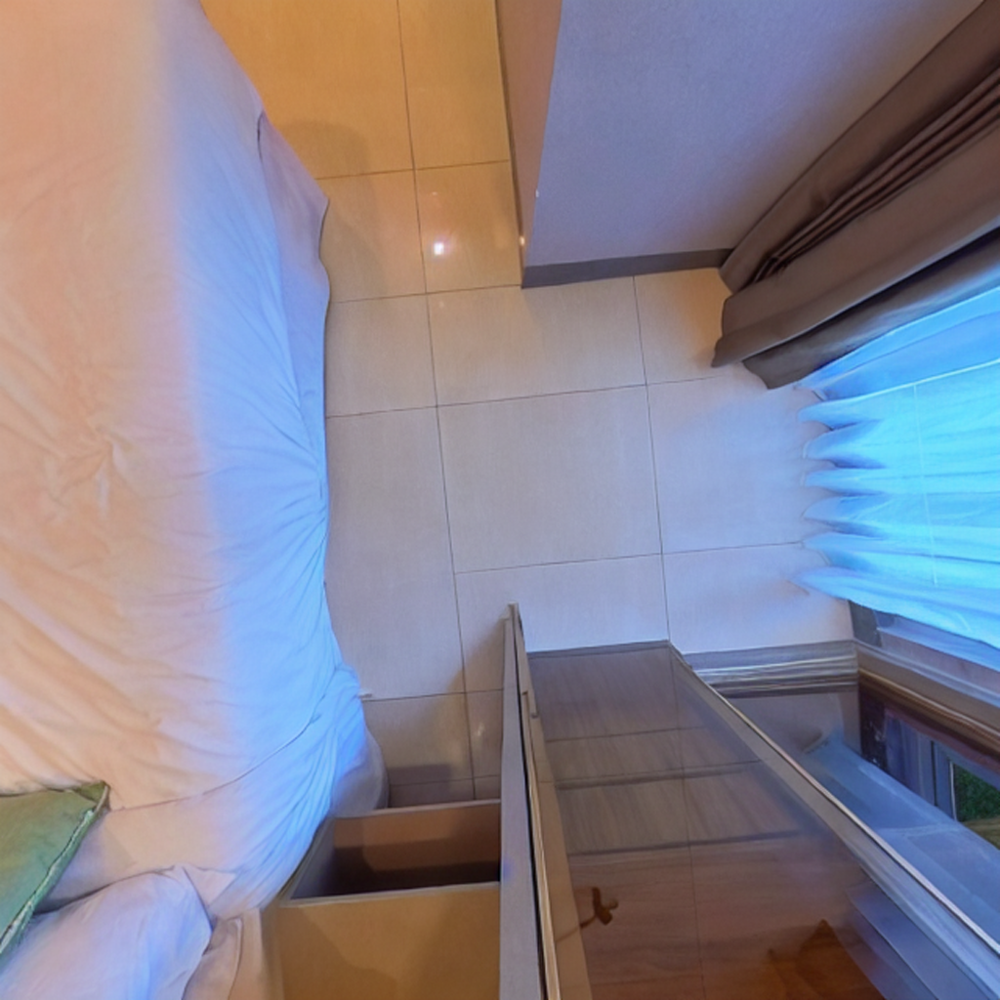

In [ ]:
import matplotlib.pyplot as plt

image = cv2.resize(np.asarray(image, dtype = 'uint8'), (1024,1024), interpolation = cv2.INTER_CUBIC)
image = Image.fromarray(image)
image

  0%|          | 0/20 [00:00<?, ?it/s]

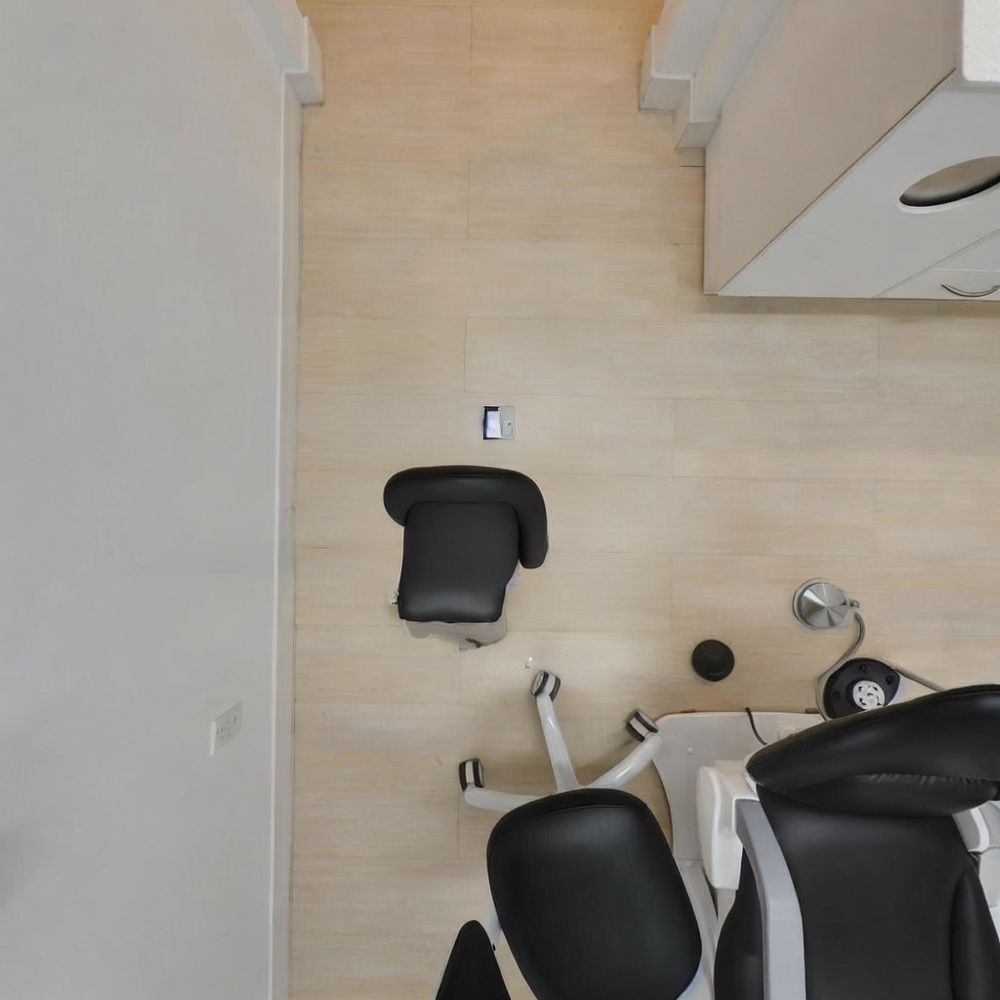

In [ ]:
prompt = "same floor, clean floor, remove objects, hide, completely hide, conceal the floor with the rectangular floor, same background,, detailed, high quality"
negative_prompt = 'mixed disrupted bulbs,switches, made up things, sheet,grass,new object, fan, objects, pieces, new, dirt, unclean floor, blur floor, mixing floor, low quality'
#image and mask_image should be PIL images.
#The mask structure is white for inpainting and black for keeping as is
image = pipe(prompt=prompt,negative_prompt=negative_prompt, image=init_image,  mask_image=mask_image, guidance_scale = 20,height = 1024, width = 1024, num_inference_steps = 20).images[0]
image

  0%|          | 0/20 [00:00<?, ?it/s]

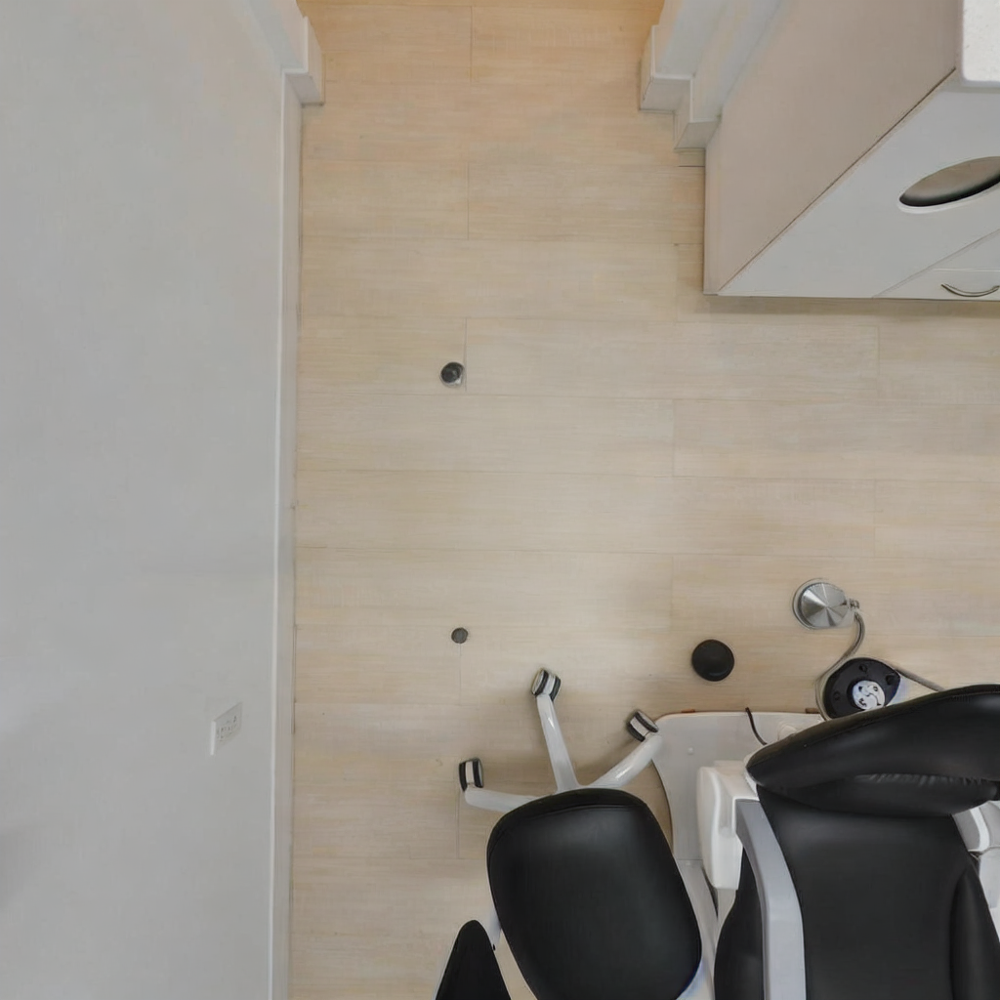

In [ ]:
prompt = "same floor, clean floor, remove objects, hide, completely hide, conceal the floor with the rectangular floor, same background,, detailed, high quality"
negative_prompt = 'mixed disrupted bulbs, sheet,grass,new object, fan, objects, pieces, new, dirt, unclean floor, blur floor, mixing floor, low quality'
#image and mask_image should be PIL images.
#The mask structure is white for inpainting and black for keeping as is
image = pipe(prompt=prompt,negative_prompt=negative_prompt, image=init_image,  mask_image=mask_image, guidance_scale = 20,height = 1024, width = 1024, num_inference_steps = 20).images[0]
image

  0%|          | 0/20 [00:00<?, ?it/s]

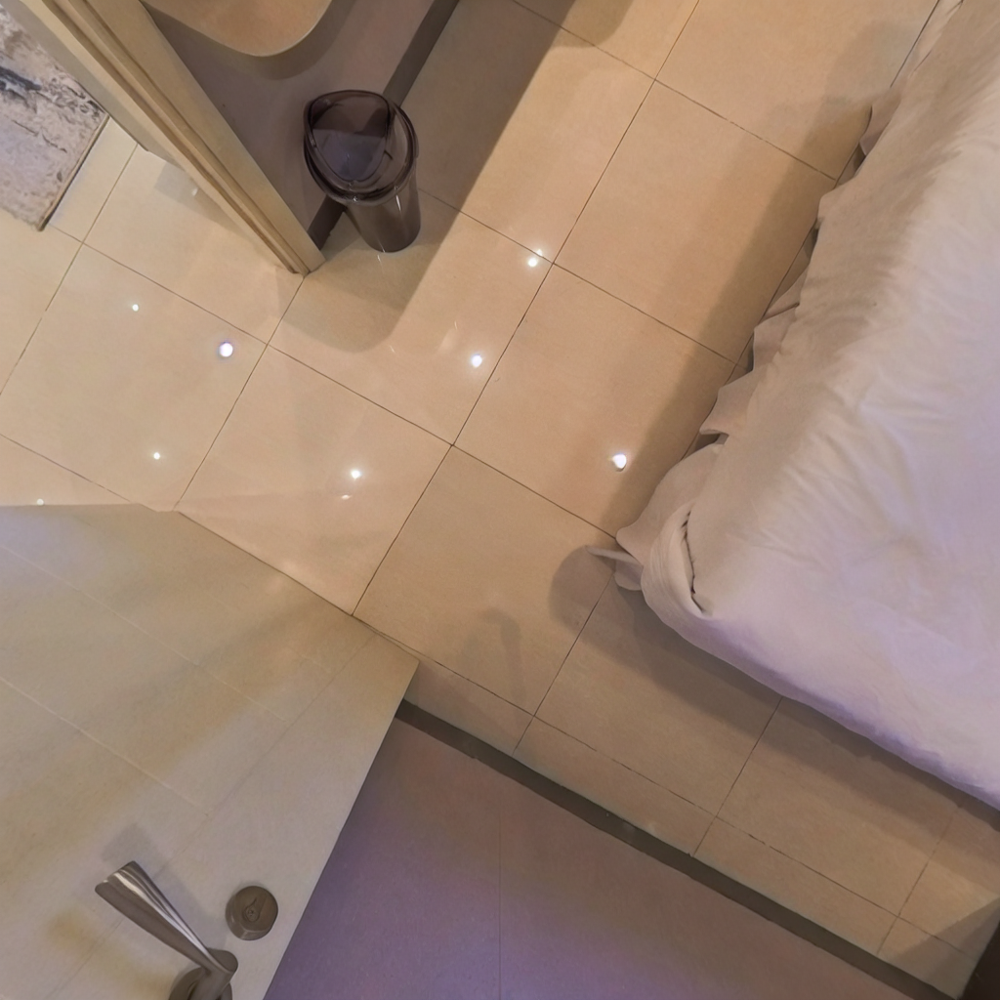

In [ ]:
prompt = "same floor, clean floor, remove objects, hide, completely hide, conceal the floor with the rectangular floor, same background,, detailed, high quality"
negative_prompt = 'mixed disrupted bulbs, sheet,grass,new object, fan, objects, pieces, new, dirt, unclean floor, blur floor, mixing floor, low quality'
#image and mask_image should be PIL images.
#The mask structure is white for inpainting and black for keeping as is
image = pipe(prompt=prompt,negative_prompt=negative_prompt, image=init_image,  mask_image=mask_image, guidance_scale = 20,height = 1024, width = 1024, num_inference_steps = 20).images[0]
image

  0%|          | 0/20 [00:00<?, ?it/s]

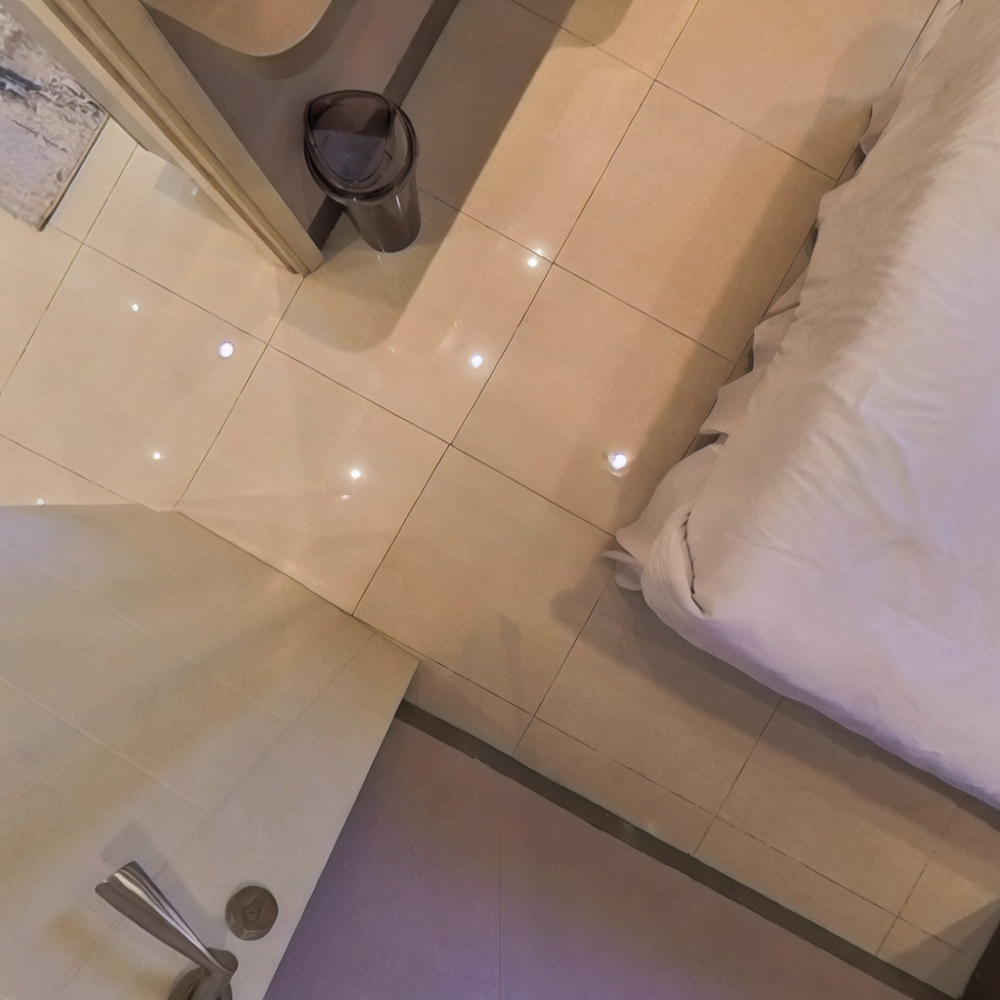

In [ ]:
prompt = "same floor, clean floor, remove objects, hide, completely hide, conceal the floor with the rectangular floor, same background,, detailed, high quality"
negative_prompt = 'mixed disrupted bulbs, sheet,grass,new object, fan, objects, pieces, new, dirt, unclean floor, blur floor, mixing floor, low quality'
#image and mask_image should be PIL images.
#The mask structure is white for inpainting and black for keeping as is
image = pipe(prompt=prompt,negative_prompt=negative_prompt, image=init_image,  mask_image=mask_image, guidance_scale = 20,height = 1024, width = 1024, num_inference_steps = 20).images[0]
image

  0%|          | 0/20 [00:00<?, ?it/s]

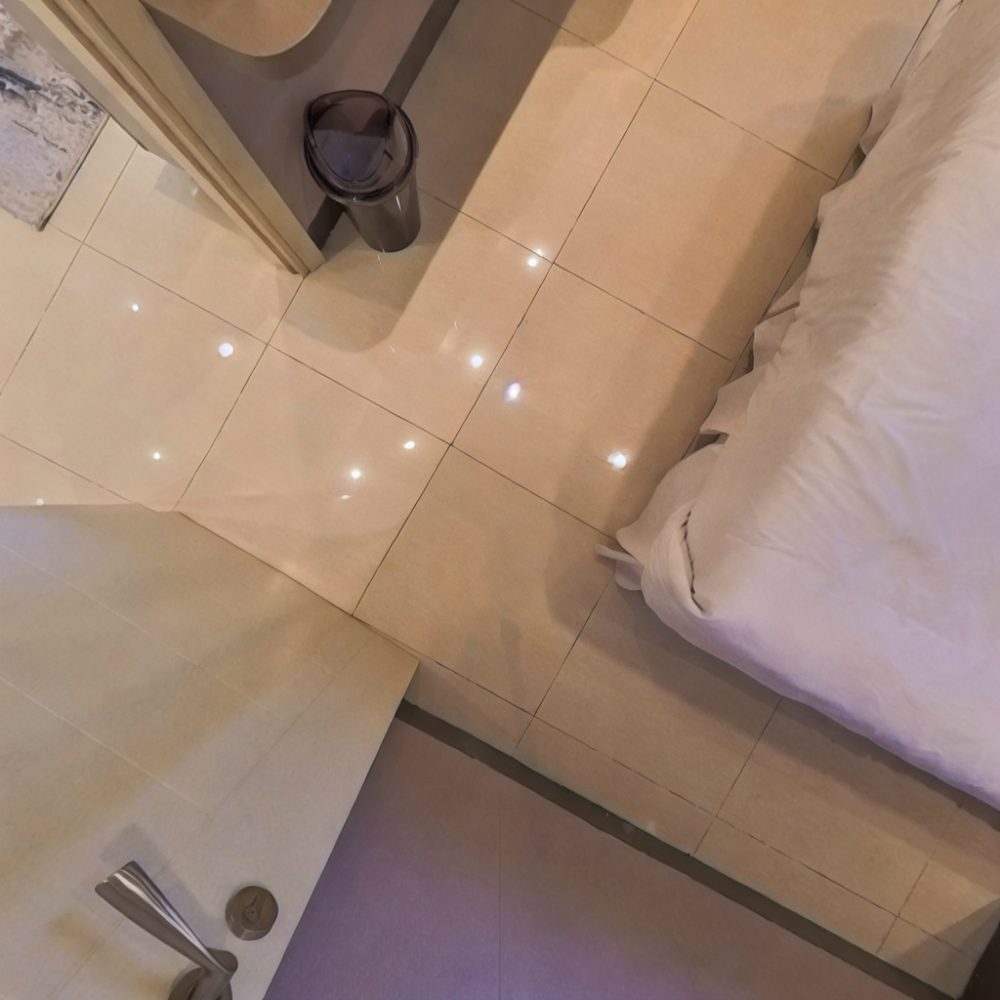

In [ ]:
prompt = "same floor, clean floor, remove objects, hide, completely hide, conceal the floor with the rectangular floor, same background,, detailed, high quality"
negative_prompt = 'mixed disrupted bulbs, sheet,grass,new object, fan, objects, pieces, new, dirt, unclean floor, blur floor, mixing floor, low quality'
#image and mask_image should be PIL images.
#The mask structure is white for inpainting and black for keeping as is
image = pipe(prompt=prompt,negative_prompt=negative_prompt, image=init_image,  mask_image=mask_image, guidance_scale = 20,height = 1024, width = 1024, num_inference_steps = 20).images[0]
image

  0%|          | 0/20 [00:00<?, ?it/s]

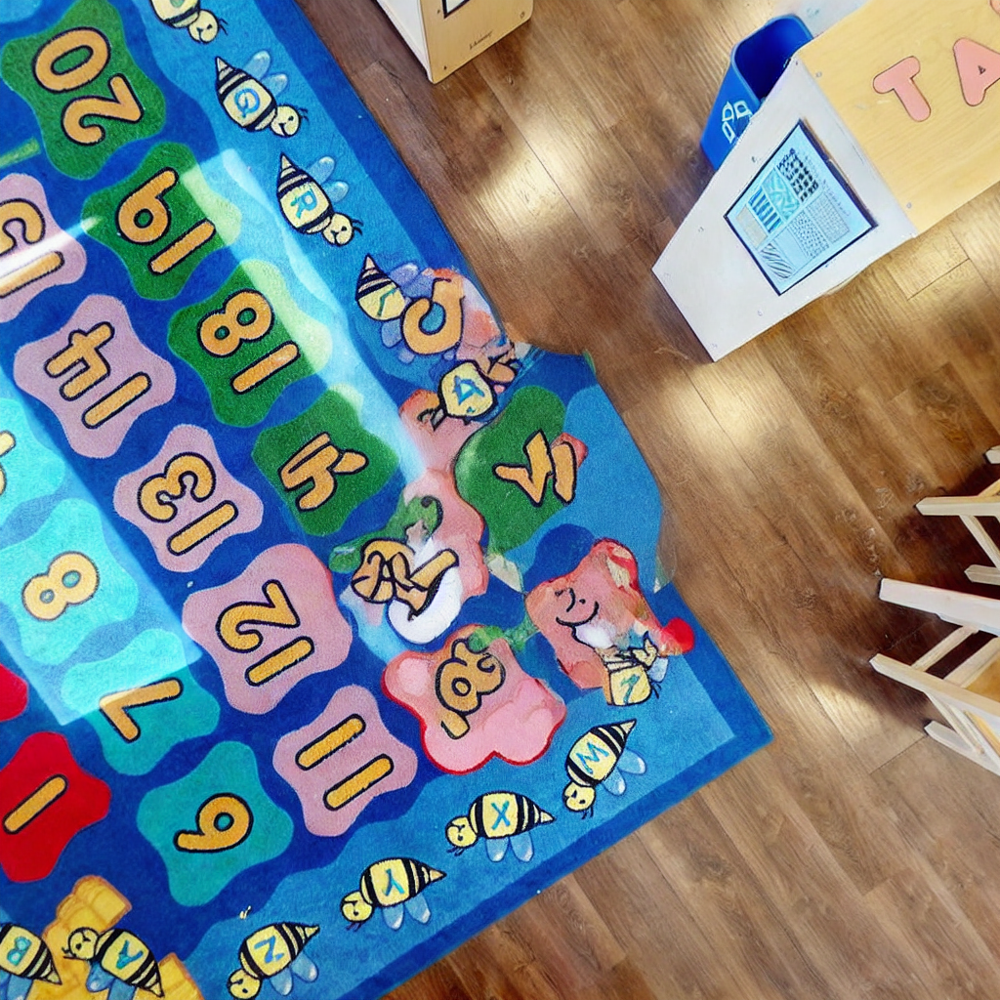

In [ ]:
prompt = "same floor, clean floor, remove objects, hide, completely hide, conceal the floor with the rectangular floor, same background,, detailed, high quality"
negative_prompt = 'mixed disrupted bulbs, sheet,grass,new object, fan, objects, pieces, new, dirt, unclean floor, blur floor, mixing floor, low quality'
#image and mask_image should be PIL images.
#The mask structure is white for inpainting and black for keeping as is
image = pipe(prompt=prompt,negative_prompt=negative_prompt, image=init_image,  mask_image=mask_image, guidance_scale = 20,height = 1024, width = 1024, num_inference_steps = 20).images[0]
image